In [1]:
import xml.etree.ElementTree as ET
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [2]:
IMG_DIR = Path('imagens')
LBL_DIR = Path('labels')

def parse_boxes(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    boxes = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bb = obj.find('bndbox')
        xmin = int(bb.find('xmin').text)
        ymin = int(bb.find('ymin').text)
        xmax = int(bb.find('xmax').text)
        ymax = int(bb.find('ymax').text)
        boxes.append((name, xmin, ymin, xmax, ymax))
    return boxes

def show_image(img_path, figsize=(16, 10)):
    xml_path = LBL_DIR / (img_path.stem + '.xml')
    if not xml_path.exists():
        print(f'No label for {img_path.name}')
        return

    img = Image.open(img_path)
    boxes = parse_boxes(xml_path)

    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(img)
    ax.set_title(f'{img_path.name}  ({len(boxes)} objects)', fontsize=12)
    ax.axis('off')

    for name, xmin, ymin, xmax, ymax in boxes:
        w, h = xmax - xmin, ymax - ymin
        rect = patches.Rectangle((xmin, ymin), w, h,
                                  linewidth=1.5, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin - 4, name, color='red', fontsize=6,
                bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))

    plt.tight_layout()
    plt.show()

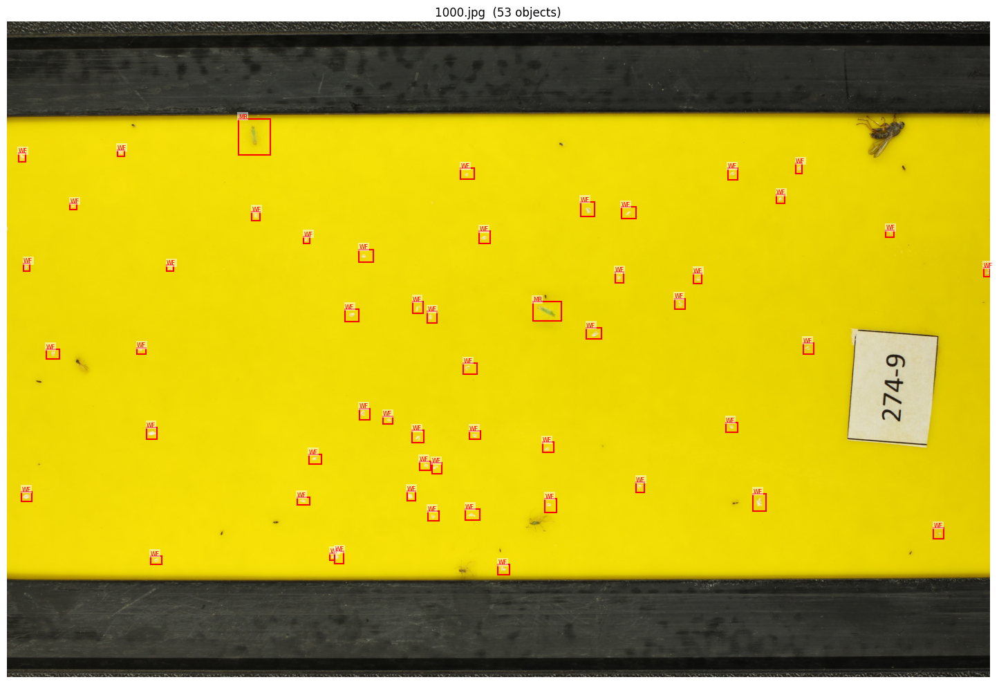

In [3]:
# Show a single image by name
show_image(IMG_DIR / '1000.jpg')

## Crop the WF and MR

In [4]:
WF_DIR = Path('WF')
MR_DIR = Path('MR')
WF_DIR.mkdir(exist_ok=True)
MR_DIR.mkdir(exist_ok=True)

OUTPUT_DIRS = {'WF': WF_DIR, 'MR': MR_DIR}

def crop_objects(img_path):
    xml_path = LBL_DIR / (img_path.stem + '.xml')
    if not xml_path.exists():
        print(f'No label for {img_path.name}')
        return

    img = Image.open(img_path)
    boxes = parse_boxes(xml_path)

    counts = {}
    for name, xmin, ymin, xmax, ymax in boxes:
        if name not in OUTPUT_DIRS:
            continue
        counts[name] = counts.get(name, 0) + 1
        crop = img.crop((xmin, ymin, xmax, ymax))
        out_path = OUTPUT_DIRS[name] / f'{img_path.stem}_{name}_{counts[name]:03d}.jpg'
        crop.save(out_path)

# Run on all images
for img_path in sorted(IMG_DIR.glob('*.jpg')):
    crop_objects(img_path)

print(f'WF crops: {len(list(WF_DIR.iterdir()))}')
print(f'MR crops: {len(list(MR_DIR.iterdir()))}')

WF crops: 6350
MR crops: 1287


## Show bounding boxes on top of original image

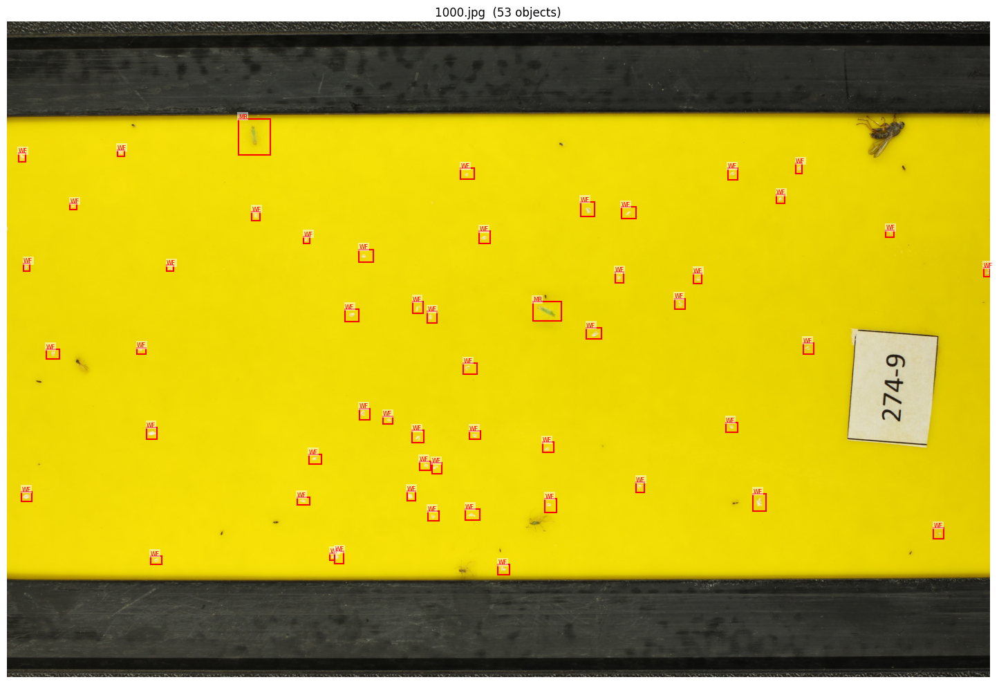

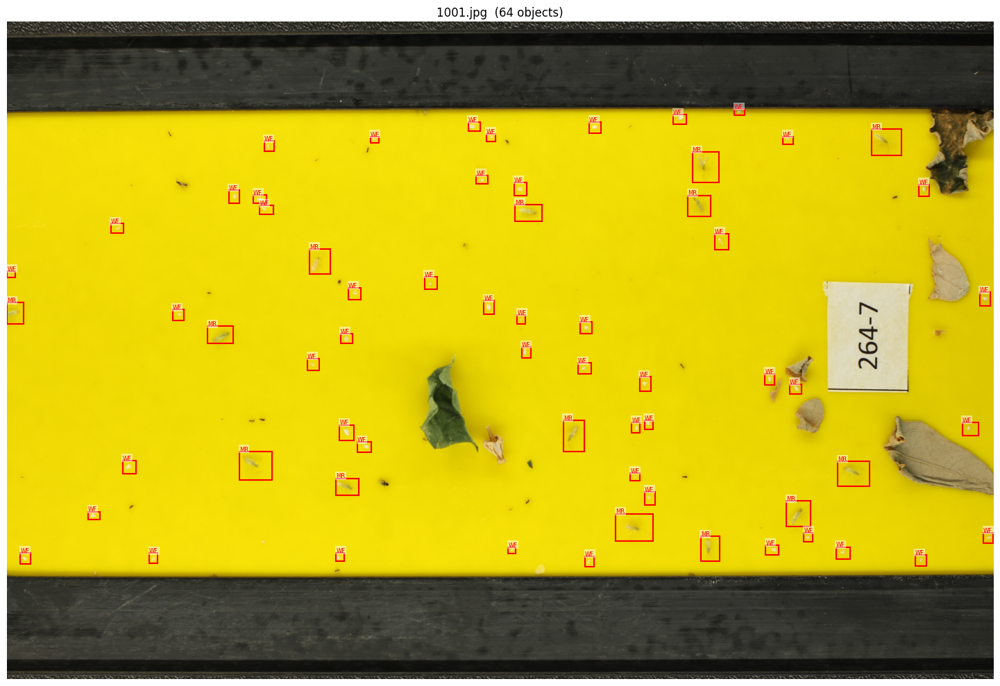

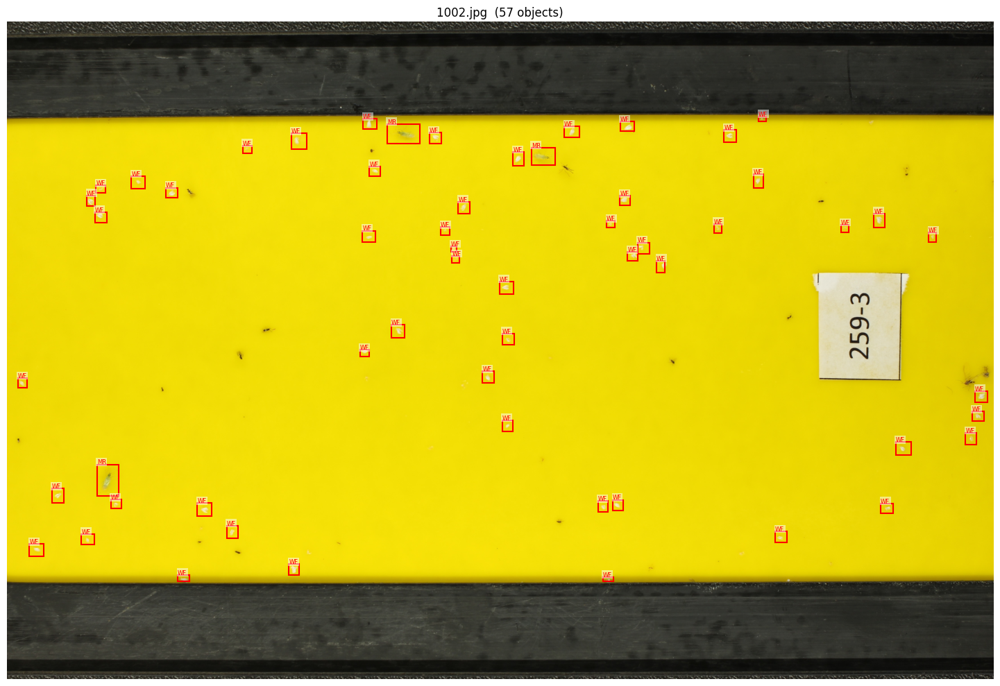

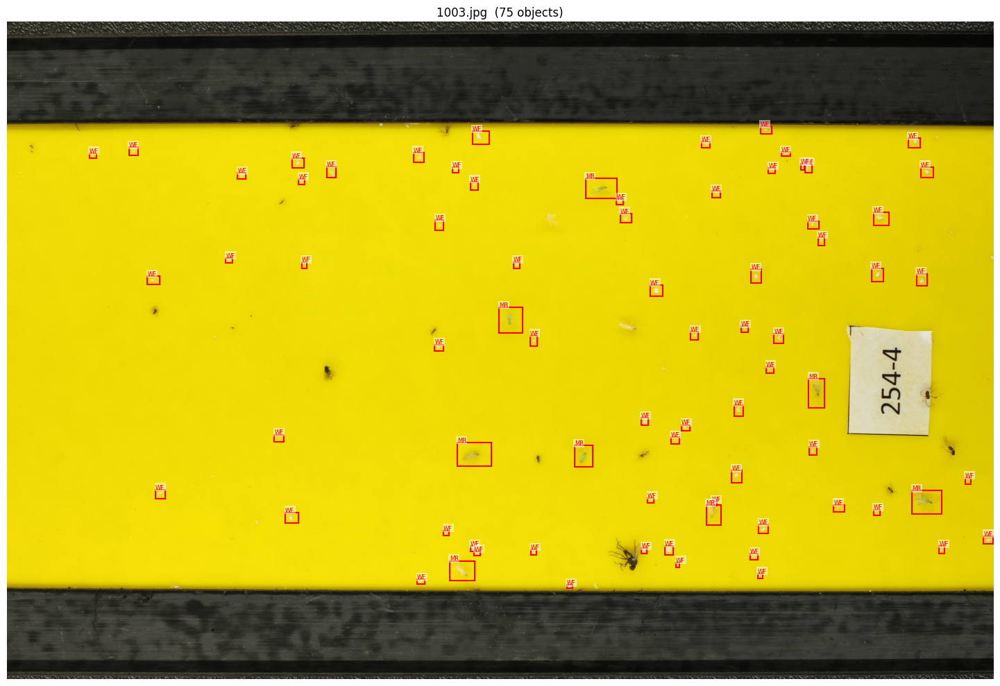

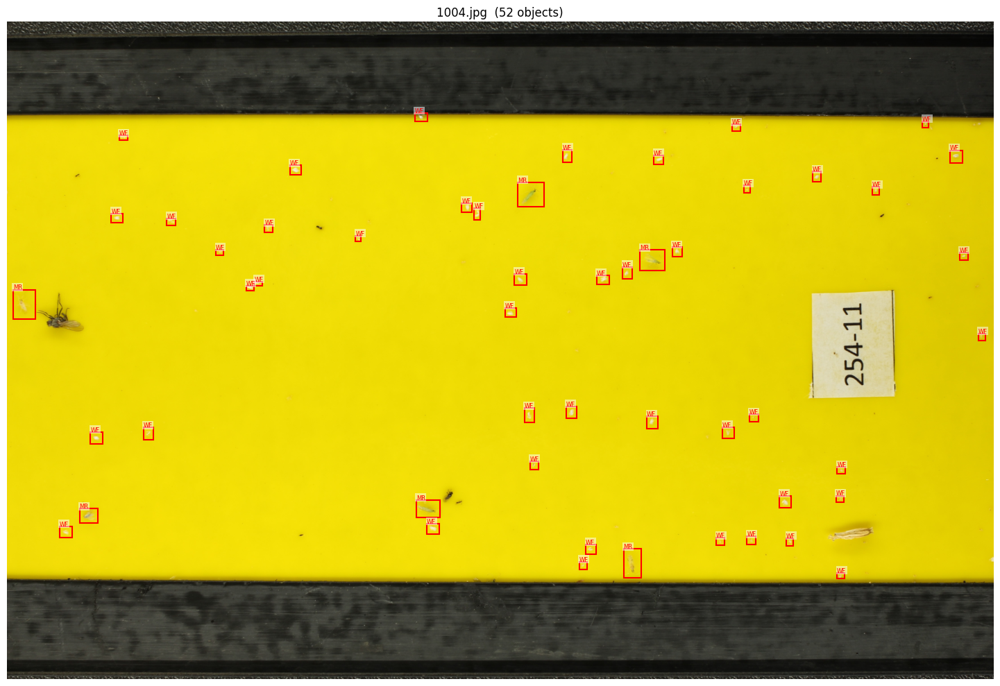

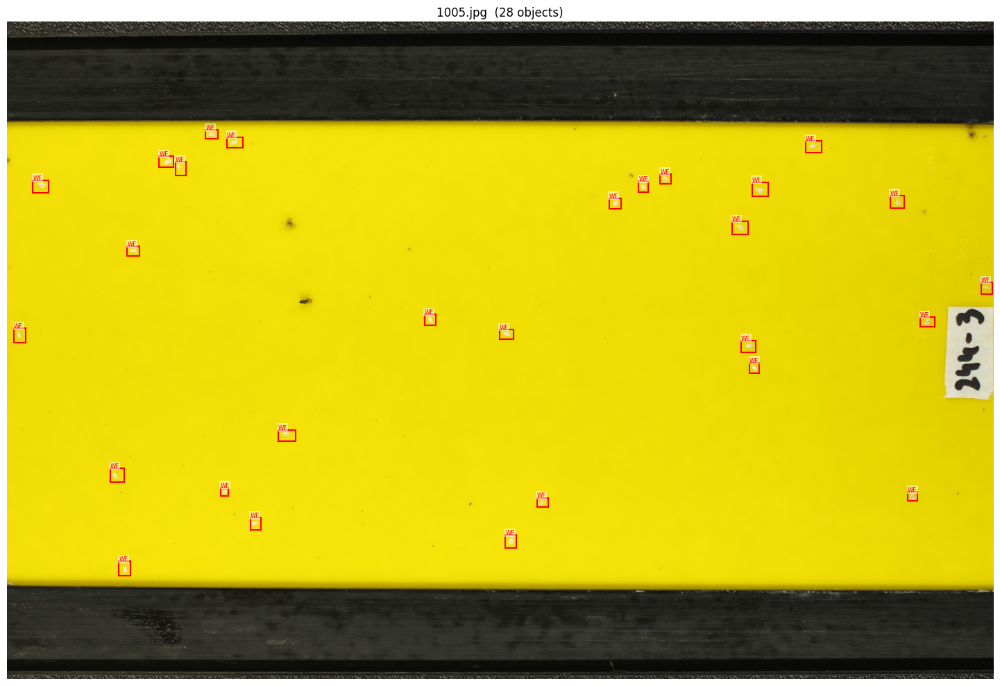

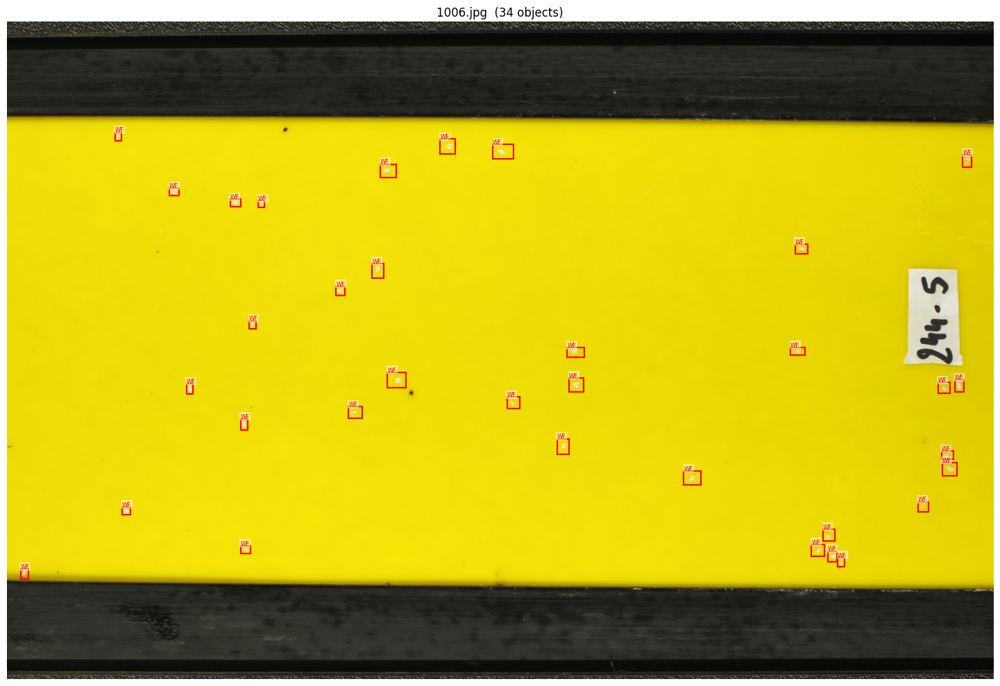

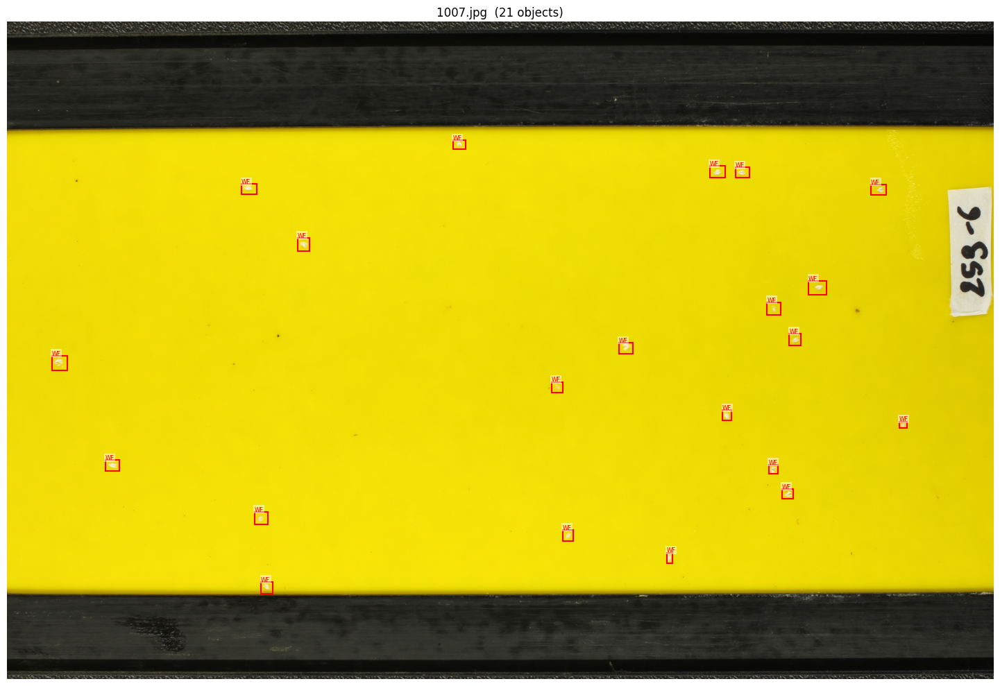

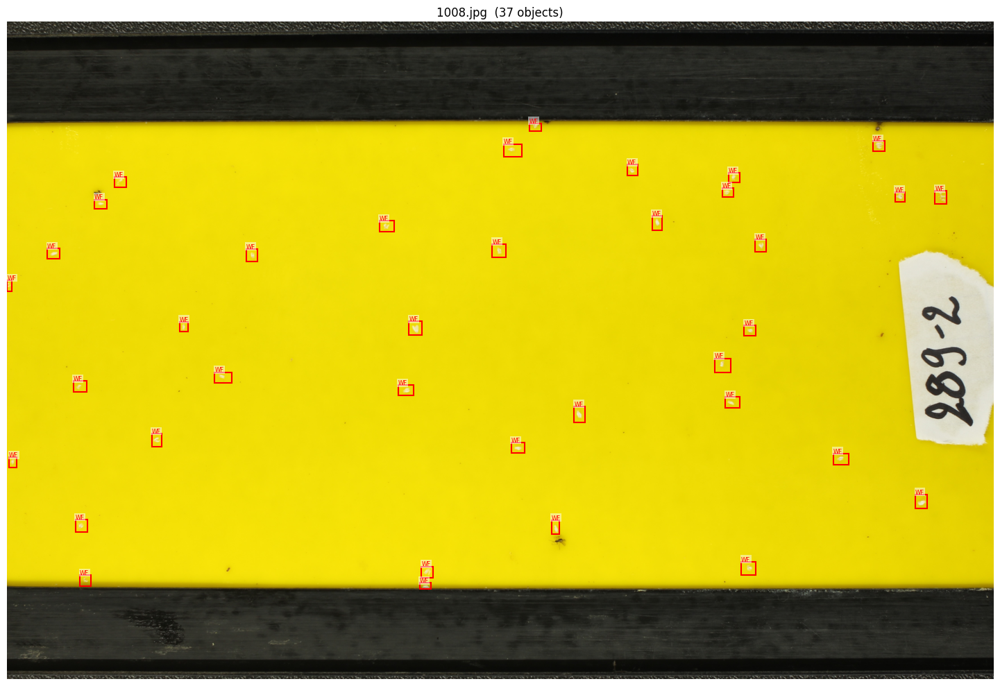

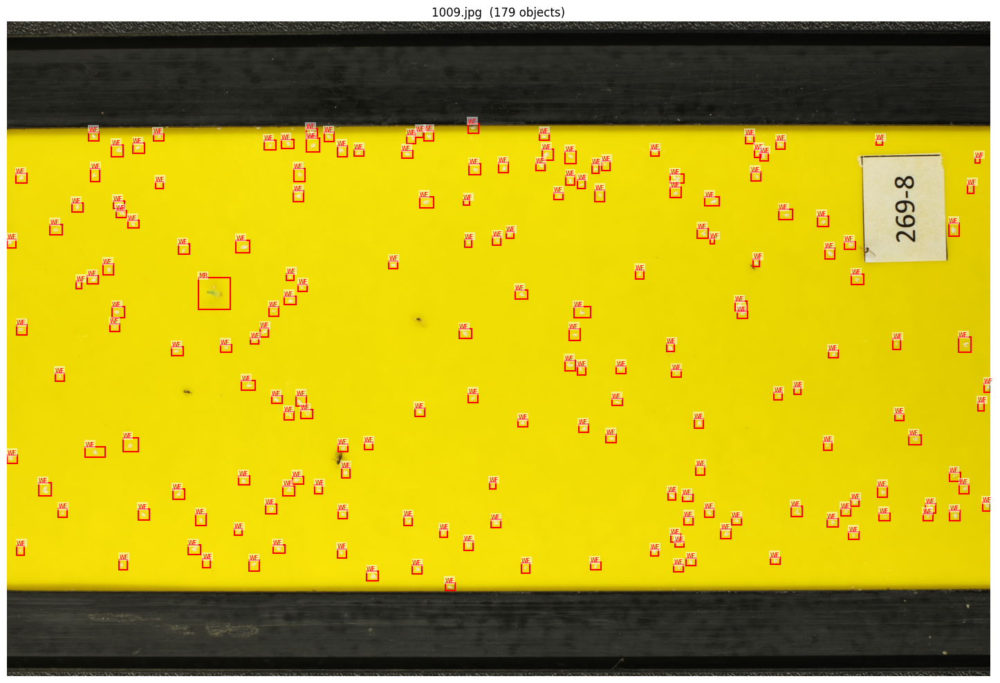

In [5]:
# Browse all images — set LIMIT to None to show all 284
LIMIT = 10

images = sorted(IMG_DIR.glob('*.jpg'))
if LIMIT:
    images = images[:LIMIT]

for img_path in images:
    show_image(img_path)